# This notebook plots all warm season MCS precipitation climatology

## Monthly mean data is produced by:
- calc_tbpf_mcs_monthly_rainmap_gridrad.py

In [1]:
import numpy as np
import glob, os
import xarray as xr
import pandas as pd
import time, datetime, calendar, pytz
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable, AxesGrid
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import colormath, colormath.color_objects, colormath.color_conversions
from colormath.color_objects import sRGBColor
import urllib
import re
import copy
%matplotlib inline

## MCS Dataset V3

In [2]:
grddir = '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/'

years = np.arange(2004,2022,1)
# years = np.arange(2004,2018,1)
months = [4,5,6,7,8]
grdfiles = []
for year in years:
    for mon in months:
        grdfiles.extend(sorted(glob.glob(f'{grddir}mcs_rainmap_{year}{mon:02}.nc')))
print(f'Number of files: {len(grdfiles)}')

figdir = '/global/cfs/cdirs/m2637/zfeng/gridrad_v3/figures/'
os.makedirs(figdir, exist_ok=True)

Number of files: 90


## MCS Dataset V2

In [3]:
# grddir = '/global/cfs/cdirs/m2637/zfeng/gridrad_v2/stats_linkpf/monthly/'

# years = np.arange(2004,2018,1)
# months = [4,5,6,7,8]
# grdfiles = []
# for year in years:
#     for mon in months:
#         grdfiles.extend(sorted(glob.glob(f'{grddir}mcs_rainmap_{year}{mon:02}.nc')))
# print(f'Number of files: {len(grdfiles)}')

# figdir = '/global/cfs/cdirs/m2637/zfeng/gridrad_v2/figures/'
# os.makedirs(figdir, exist_ok=True)

In [4]:
grdfiles

['/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200404.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200405.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200406.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200407.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200408.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200504.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200505.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200506.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200507.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200508.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200604.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainmap_200605.nc',
 '/pscratch/sd/f/feng045/usa/gridrad_v3/stats/monthly/mcs_rainma

# These customed functions enables use of [NCL colormaps](https://www.ncl.ucar.edu/Document/Graphics/color_table_gallery.shtml)

In [5]:
color_obj_dict = {'sRGB':colormath.color_objects.sRGBColor,
                  'HSV':colormath.color_objects.HSVColor,
                  'Lab':colormath.color_objects.LabColor,
                  'LCHuv':colormath.color_objects.LCHuvColor,
                  'LCHab':colormath.color_objects.LCHabColor,
                  'XYZ':colormath.color_objects.XYZColor}

def __rgb_to_array(rgb_color):
    r = np.minimum(1, round(rgb_color.rgb_r*10000)/10000)
    g = np.minimum(1, round(rgb_color.rgb_g*10000)/10000)
    b = np.minimum(1, round(rgb_color.rgb_b*10000)/10000)
    return r,g,b


def create_palette(start_rgb, end_rgb, n, colorspace):
    # convert start and end to a point in the given colorspace
    start = colormath.color_conversions.convert_color(start_rgb, colorspace).get_value_tuple()
    end = colormath.color_conversions.convert_color(end_rgb, colorspace).get_value_tuple()

    # create a set of n points along start to end
    points = list(zip(*[np.linspace(start[i], end[i], n) for i in range(3)]))

    # create a color for each point and convert back to rgb
    rgb_colors = [colormath.color_conversions.convert_color(colorspace(*point), sRGBColor) for point in points]

    # finally convert rgb colors back to hex
    return [__rgb_to_array(color) for color in  rgb_colors]


def __retrive_NCL_webcontent(cmapname):
    target_url = 'https://www.ncl.ucar.edu/Document/Graphics/ColorTables/Files/%s.rgb' % cmapname
    request = urllib.request.urlopen(target_url)
    return request


def __collect_discrete_NCL_cmap(cmapname):
    rawdata = __retrive_NCL_webcontent(cmapname)
    
    cmap_color_list = list()
    
    color_section_sig = 0
    
    for line in rawdata:
        
        line_decode = line.decode('utf-8')
        info = re.split('\s+', line_decode.replace('\n','').replace('^\s+',''))

        if color_section_sig==1:
            if info[0]=='' and len(info)>=3:
                if np.maximum(np.maximum(float(info[1]), float(info[2])), float(info[3]))>1:
                    cmap_color_list.append((float(info[1])/255, float(info[2])/255, float(info[3])/255))
                else:
                    cmap_color_list.append((float(info[1]), float(info[2]), float(info[3])))
            if len(info)==3:
                if ';' in info[0] or '#' in info[0]:
                    whatisthis = 's'
                else:
                    if np.maximum(np.maximum(float(info[0]), float(info[1])), float(info[2]))>1:
                        cmap_color_list.append((float(info[0])/255, float(info[1])/255, float(info[2])/255))
                    else:
                        cmap_color_list.append((float(info[0]), float(info[1]), float(info[2])))
        
        if 'ncolors' in str(info[0]):
            color_section_sig = 1  # meaning now we are at color lines (or "r g b" line)

    return cmap_color_list


def __cmap_refinement(raw_cmap_rgb, n_interpolate=10, workspace=color_obj_dict['sRGB']):
    # workspace:  choose which color space the refinement is conducted.
    #             refer to https://stackoverflow.com/questions/55032648/given-a-start-color-and-a-middle-color-how-to-get-the-remaining-colors-python

    n_in = len(raw_cmap_rgb)

    new_array = list()

    for i in np.arange(n_in-1):
        out_colors = create_palette(sRGBColor(*raw_cmap_rgb[i], is_upscaled=False), sRGBColor(*raw_cmap_rgb[i+1], is_upscaled=False), n_interpolate+1, workspace)
        for j in np.arange(len(out_colors)-1):
            new_array.append(out_colors[j])

    return new_array


def generate_NCL_cmap(cmapname, cont_opt=False, cont_param_n=10, cont_param_ws='sRGB',
                      white_first=False, white_ext=False, reverse_cmap=False):
    # description:
    #     cmapname:      taken as shown on the NCL website
    #     cont_opt:      to convert the discreate colormap to continuous colormap
    #     cont_param_n:  how many "intermediate" colors to be inserted to the nearby discreate colors
    #     cont_param_ws: color space to conduct interploation. Default to "sRGB", which should work for most cases
    #     white_first:   whether to set the first color as white. May be useful if the minimum does not mean anything
    #     white_ext:     whether to add this above white as an extended color (when set to True), or just replace the first color (when set to False).
    #     reverse_cmap:  similar to "_r" in colormap.
    # note:  reverse_cmap is applied first, then white_first option.

    cmap_discrete_raw = __collect_discrete_NCL_cmap(cmapname)

    if reverse_cmap==True:
        cmap_discrete_raw.reverse()

    if white_first==True:
        if white_ext==True:
            cmap_discrete = list()
            cmap_discrete.append((1,1,1))
            for i in np.arange(len(cmap_discrete_raw)):
                cmap_discrete.append(cmap_discrete_raw[int(i)])
        else:
            cmap_discrete = cmap_discrete_raw.copy()
        cmap_discrete[0] = (1,1,1)
    else:
        cmap_discrete = cmap_discrete_raw

    if cont_opt==False:
        out_cmap = cmap_discrete

    if cont_opt==True:
        out_cmap = __cmap_refinement(cmap_discrete, n_interpolate=cont_param_n, workspace=color_obj_dict[cont_param_ws])

    return mpl.colors.ListedColormap(out_cmap)

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """ Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [6]:
ds = xr.open_mfdataset(grdfiles, concat_dim='time', combine='nested')
ds

<xarray.Dataset>
Dimensions:                  (time: 90, lat: 715, lon: 1100)
Coordinates:
  * time                     (time) datetime64[ns] 2004-04-01 ... 2021-08-01
  * lat                      (lat) float32 25.02 25.05 25.09 ... 50.96 50.99
  * lon                      (lon) float32 -110.0 -110.0 ... -70.05 -70.01
Data variables:
    longitude                (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    latitude                 (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    precipitation            (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    mcs_precipitation        (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    mcs_precipitation_count  (time, lat, lon) float32 dask.array<chunksize=(1, 715, 1100), meta=np.ndarray>
    ntimes                   (time) float32 dask.array<chunksize=(1,), meta=np.ndarray>
Attributes:
    title:       MCS precipitation accumulation
    contact:     Zhe Feng, zhe.feng@pnnl.gov
    created_on:  Wed Jul 17 19:44:42 2024

In [7]:
year_min = np.min(years)
year_max = np.max(years)
print(year_min, year_max)

2004 2021


In [8]:
nhours = ds.ntimes.groupby('time.year').sum().load()

totpcp_year = (24 * ds.precipitation.groupby('time.year').sum(dim='time') / nhours).load()
mcspcp_year = (24 * ds.mcs_precipitation.groupby('time.year').sum(dim='time') / nhours).load()
mcsfrac_year = (100 * mcspcp_year / totpcp_year).load()
mcsfreq_year = (100 * ds.mcs_precipitation_count.groupby('time.year').sum(dim='time') / nhours).load()

In [9]:
nhours_month = ds.ntimes.groupby('time.month').sum().load()

totpcp_month = (24 * ds.precipitation.groupby('time.month').sum(dim='time') / nhours_month).load()
mcspcp_month = (24 * ds.mcs_precipitation.groupby('time.month').sum(dim='time') / nhours_month).load()
mcsfrac_month = (100 * mcspcp_month / totpcp_month).load()

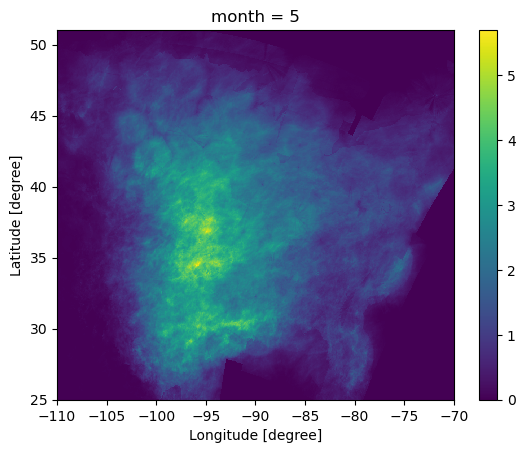

In [10]:
mcspcp_month.sel(month=5).plot()

In [11]:
# lonbox = [-104, -82]
# lonbox = [-104, -85]
lonbox = [-102, -85]
latbox = [31, 48]
# Calculate average value within central U.S. defined by the box
totpcp_avg = (totpcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat'))).load()
mcspcp_avg = (mcspcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat'))).load()
mcsfrac_avg = (100 * mcspcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                totpcp_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))).load()
mcsfreq_avg = (mcsfreq_year.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat'))).load()

In [12]:
months = ds.time.dt.month
months

/global/common/software/m1867/python/py310/lib/python3.10/site-packages/xarray/core/accessor_dt.py:72: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  values_as_series = pd.Series(values.ravel(), copy=False)


<xarray.DataArray 'month' (time: 90)>
array([4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7,
       8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6,
       7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5,
       6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8, 4, 5, 6, 7, 8])
Coordinates:
  * time     (time) datetime64[ns] 2004-04-01 2004-05-01 ... 2021-08-01
Attributes:
    long_name:  Epoch Time (since 1970-01-01T00:00:00)

In [13]:
# Total number of hours
nhours_mam = ds.ntimes.where((months >= 3) & (months <= 5)).sum(dim='time')
nhours_jja = ds.ntimes.where((months >= 6) & (months <= 8)).sum(dim='time')

In [14]:
# Total number of hours for each season
nhours_mam_year = ds.ntimes.where((months >= 3) & (months <= 5)).groupby('time.year').sum()
nhours_jja_year = ds.ntimes.where((months >= 6) & (months <= 8)).groupby('time.year').sum()
# Spring vs. Summer mean precipitation
totpcp_mam_year = 24 * ds.precipitation.where((months >= 3) & (months <= 5)).groupby('time.year').sum(dim='time') / nhours_mam_year
mcspcp_mam_year = 24 * ds.mcs_precipitation.where((months >= 3) & (months <= 5)).groupby('time.year').sum(dim='time') / nhours_mam_year
totpcp_jja_year = 24 * ds.precipitation.where((months >= 6) & (months <= 8)).groupby('time.year').sum(dim='time') / nhours_jja_year
mcspcp_jja_year = 24 * ds.mcs_precipitation.where((months >= 6) & (months <= 8)).groupby('time.year').sum(dim='time') / nhours_jja_year
# MCS frequency
mcsfreq_mam_year = 100 * ds.mcs_precipitation_count.where((months >= 3) & (months <= 5)).groupby('time.year').sum(dim='time') / nhours_mam_year
mcsfreq_jja_year = 100 * ds.mcs_precipitation_count.where((months >= 6) & (months <= 8)).groupby('time.year').sum(dim='time') / nhours_jja_year

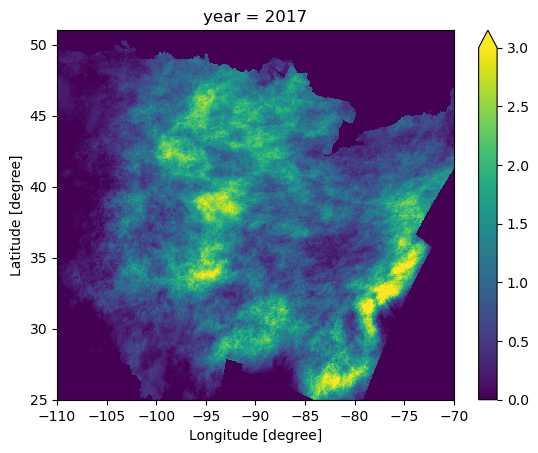

In [15]:
mcsfreq_jja_year.sel(year=2017).plot(vmax=3)

In [16]:
mcsfreq_avg.values

array([1.3541052, 1.1207169, 1.0053738, 1.2043352, 1.5957248, 1.46676  ,
       1.378733 , 1.4831332, 0.9703969, 1.5237347, 1.5591769, 1.6787565,
       1.6884398, 1.6849103, 1.3673457, 1.921586 , 1.1835343, 1.3110609],
      dtype=float32)

In [17]:
totpcp_month_avg = totpcp_month.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat'))
mcspcp_month_avg = mcspcp_month.sel(lon=slice(lonbox[0], lonbox[1]), lat=slice(latbox[0], latbox[1])).mean(dim=('lon','lat'))
mcsfrac_month_avg = 100 * mcspcp_month.sel(lon=slice(lonbox[0], lonbox[1]), \
                                           lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat')) / \
                            totpcp_month.sel(lon=slice(lonbox[0], lonbox[1]), \
                                           lat=slice(latbox[0], latbox[1])).sum(dim=('lon','lat'))

In [18]:
mcsfrac_month_avg.values

array([56.807156, 60.7731  , 57.224022, 53.467678, 51.688896],
      dtype=float32)

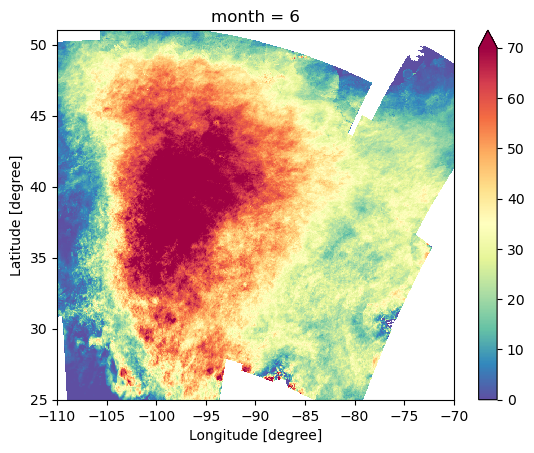

In [19]:
mcsfrac_month.sel(month=6).plot(vmin=0, vmax=70, cmap='Spectral_r')

In [20]:
# mcspcp_year

## MCS multi-year mean monthly rainmap

/global/cfs/cdirs/m2637/zfeng/gridrad_v3/figures/Apr-Aug_mcs_monthly_allseason_mean_rainmap_2004_2021.png


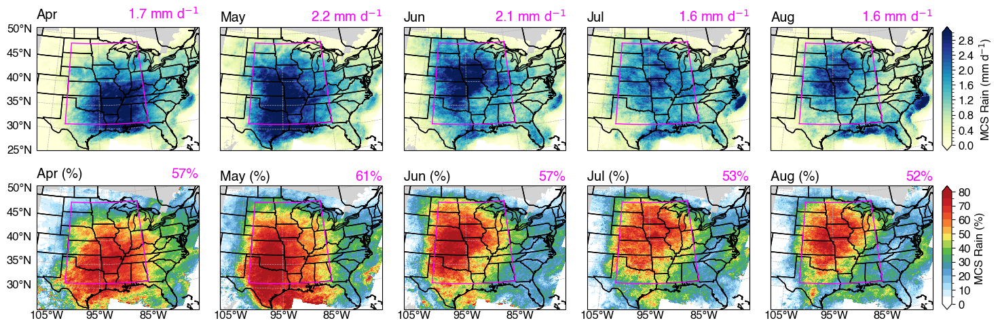

In [21]:
mpl.rcParams['font.size'] = 12
mpl.rcParams['font.family'] = 'Helvetica'
fig = plt.figure(figsize=[14,5], dpi=100)

levelspcp = np.arange(0, 3.01, 0.1)
levelsfrac = np.arange(0, 80.1, 5)
cmappcp = 'YlGnBu'
# cmapfrac = 'Spectral_r'
cmapfrac = generate_NCL_cmap('WhiteBlueGreenYellowRed', cont_opt=False, cont_param_n=0, cont_param_ws='sRGB')
cmapfrac = truncate_colormap(cmapfrac, 0.0, 0.95)

map_extent = [-107, -76.1, 25, 50.1]
lonv = np.arange(-105,-75.1,10)
latv = np.arange(25,50.1,5)
# Set up map projection
proj = ccrs.LambertConformal()
data_proj = ccrs.PlateCarree()

resolution = '50m'
land = cfeature.NaturalEarthFeature('physical', 'land', resolution)
borders = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)
states = cfeature.NaturalEarthFeature('cultural', 'admin_1_states_provinces_lakes', resolution)

titles = ['Apr', 'May', 'Jun', 'Jul', 'Aug', \
          'Apr (%)', 'May (%)', 'Jun (%)', 'Jul (%)', 'Aug (%)']

ax_save = []
for pp in range(0,10):

    if (pp <= 4):
        data = mcspcp_month.isel(month=pp)
        levels = levelspcp
        cmap = cmappcp
        avgval = f'{mcspcp_month_avg.isel(month=pp).values.item():.1f} '+'mm d$^{-1}$'
    else:
        data = mcsfrac_month.isel(month=pp-5)
        levels = levelsfrac
        cmap = cmapfrac
        avgval = f'{mcsfrac_month_avg.isel(month=pp-5).values.item():.0f}%'
    lon = ds.lon
    lat = ds.lat    

    ax = plt.subplot(2, 5, pp+1, projection=proj)
    ax.set_extent(map_extent, crs=data_proj)
    ax.add_feature(land, facecolor='lightgray')
    ax.add_feature(states, linewidth=1, edgecolor='k', facecolor='none', zorder=5)
    ax.add_feature(borders, edgecolor='k', facecolor='none', linewidth=1, zorder=5)
    ax.add_feature(land, facecolor='none', edgecolor='k', zorder=5)
    
    # Grid lines
    gl = ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5, dms=True, x_inline=False, y_inline=False)        
    gl.xlocator = mpl.ticker.FixedLocator(lonv)
    gl.ylocator = mpl.ticker.FixedLocator(latv)
    # Set the formatters for the gridlines
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    gl.xlabel_style = {'rotation': 0, 'ha': 'center'}
    gl.ylabel_style = {'rotation': 0}
    # Remove all labels by default
    gl.top_labels = False
    gl.bottom_labels = False
    gl.left_labels = False
    gl.right_labels = False
    if (pp >= 5):
        gl.bottom_labels = True
    if (pp % 5) == 0:
        gl.left_labels = True
    
    cmap = copy.copy(mpl.colormaps.get_cmap(cmap))
    norm = mpl.colors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
    Zm = np.ma.masked_where(((data == 0) | (np.isnan(data))), data)
    cf1 = plt.pcolormesh(lon, lat, Zm, norm=norm, cmap=cmap, transform=data_proj, zorder=2)
    ax.set_title(titles[pp], loc='left')
    ax.set_title(avgval, loc='right', color='magenta')
    ax.set_aspect('auto', adjustable=None)
    ax_save.append(ax)
    
    # Central US Box
    x1 = np.arange(lonbox[0],lonbox[1]+0.01,0.1)
    y1 = np.repeat(latbox[0],len(x1))
    y2 = np.arange(latbox[0],latbox[1]+0.01,0.1)
    x2 = np.repeat(lonbox[1],len(y2))
    y3 = np.repeat(latbox[1],len(x1))
    x4 = np.repeat(lonbox[0],len(y2))
    ax.plot(x1, y1, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
    ax.plot(x2, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
    ax.plot(x1, y3, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
    ax.plot(x4, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)

fig.tight_layout()

# Colorbar
norm = mpl.colors.BoundaryNorm(levelspcp, ncolors=cmap.N, clip=True)
axpos = ax_save[4].get_position()
cax = plt.axes([axpos.x1+0.01, axpos.y0, 0.01, (axpos.y1-axpos.y0)])
cbar = mpl.colorbar.ColorbarBase(cax, norm=norm, cmap=cmappcp, extend='both')
cbar.set_label('MCS Rain (mm d$^{-1}$)', fontweight='regular')

norm = mpl.colors.BoundaryNorm(levelsfrac, ncolors=cmapfrac.N, clip=True)
axpos = ax_save[9].get_position()
cax = plt.axes([axpos.x1+0.01, axpos.y0, 0.01, (axpos.y1-axpos.y0)])
cbar = mpl.colorbar.ColorbarBase(cax, norm=norm, cmap=cmapfrac, extend='both')
cbar.set_label('MCS Rain (%)', fontweight='regular')

figname = f'{figdir}Apr-Aug_mcs_monthly_allseason_mean_rainmap_{year_min}_{year_max}.png'
fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='w')
print(figname)

## MCS warm seaon mean rainmap by year

In [22]:
def plot_map_by_year(lon, lat, data_arr, avg_arr, levels, cmap, cblabel, figname):
    mpl.rcParams['font.size'] = 12
    mpl.rcParams['font.family'] = 'Helvetica'
    fig = plt.figure(figsize=[16,10], dpi=100)
    
    map_extent = [-107, -76.1, 25, 50.1]
    lonv = np.arange(-105,-75.1,10)
    latv = np.arange(25,50.1,5)

    # Set up map projection
    proj = ccrs.LambertConformal()
    data_proj = ccrs.PlateCarree()
    resolution = '50m'
    land = cfeature.NaturalEarthFeature('physical', 'land', resolution)
    borders = cfeature.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)
    states = cfeature.NaturalEarthFeature('cultural', 'admin_1_states_provinces_lakes', resolution)

    ax_save = []
    for pp in range(0,18):

        data = data_arr.isel(year=pp)
        title = str(data_arr.year[pp].values)

        ax = plt.subplot(4, 5, pp+1, projection=proj)
        ax.set_extent(map_extent, crs=data_proj)
        ax.add_feature(land, facecolor='lightgray')
        ax.add_feature(states, linewidth=1, edgecolor='k', facecolor='none', zorder=5)
        ax.add_feature(borders, edgecolor='k', facecolor='none', linewidth=1, zorder=5)
        ax.add_feature(land, facecolor='none', edgecolor='k', zorder=5)
        
        # Grid lines
        gl = ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5, dms=True, x_inline=False, y_inline=False)        
        gl.xlocator = mpl.ticker.FixedLocator(lonv)
        gl.ylocator = mpl.ticker.FixedLocator(latv)
        # Set the formatters for the gridlines
        gl.xformatter = LongitudeFormatter()
        gl.yformatter = LatitudeFormatter()
        gl.xlabel_style = {'rotation': 0, 'ha': 'center'}
        gl.ylabel_style = {'rotation': 0}
        # Remove all labels by default
        gl.top_labels = False
        gl.bottom_labels = False
        gl.left_labels = False
        gl.right_labels = False
        if (pp >= 15):
            gl.bottom_labels = True
        if (pp % 5) == 0:
            gl.left_labels = True

        # Plot
        cmap = copy.copy(mpl.colormaps.get_cmap(cmap))
        norm = mpl.colors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        Zm = np.ma.masked_where(((data == 0) | (np.isnan(data))), data)
        cf1 = ax.pcolormesh(lon, lat, Zm, norm=norm, cmap=cmap, transform=ccrs.PlateCarree(), zorder=2)
        ax.set_title(title, loc='left')
        # ax.set_title(f'{avg_arr[pp]}', loc='right', color='magenta')
        ax.set_aspect('auto', adjustable=None)
        ax_save.append(ax)
        
        # Plot mean values
        if avg_arr is not None:
            # Mean value
            ax.set_title(avg_arr[pp], loc='right', color='magenta')
            # Central US Box
            x1 = np.arange(lonbox[0],lonbox[1]+0.01,0.1)
            y1 = np.repeat(latbox[0],len(x1))
            y2 = np.arange(latbox[0],latbox[1]+0.01,0.1)
            x2 = np.repeat(lonbox[1],len(y2))
            y3 = np.repeat(latbox[1],len(x1))
            x4 = np.repeat(lonbox[0],len(y2))
            ax.plot(x1, y1, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x2, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x1, y3, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)
            ax.plot(x4, y2, color='magenta', lw=1, transform=ccrs.PlateCarree(), zorder=6)

    fig.tight_layout()

    # Colorbar
    # norm = mpl.colors.Normalize(vmin=min(levels), vmax=max(levels))
    norm = mpl.colors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
    axpos1 = ax_save[13].get_position()
    axpos2 = ax_save[14].get_position()
    axpos3 = ax_save[-1].get_position()
    cax = plt.axes([axpos1.x0*1.05, axpos3.y0+(axpos3.y1 - axpos3.y0)/2, (axpos2.x1-axpos1.x0)*0.85, 0.02])
    cbar = mpl.colorbar.ColorbarBase(cax, norm=norm, cmap=cmap, orientation='horizontal', extend='both')
    cbar.set_label(cblabel, fontsize=16)
    cbar.ax.tick_params(labelsize=16)
    # cbar.set_ticks(cbticks)

    fig.savefig(figname, dpi=300, bbox_inches='tight', facecolor='white')
    return fig

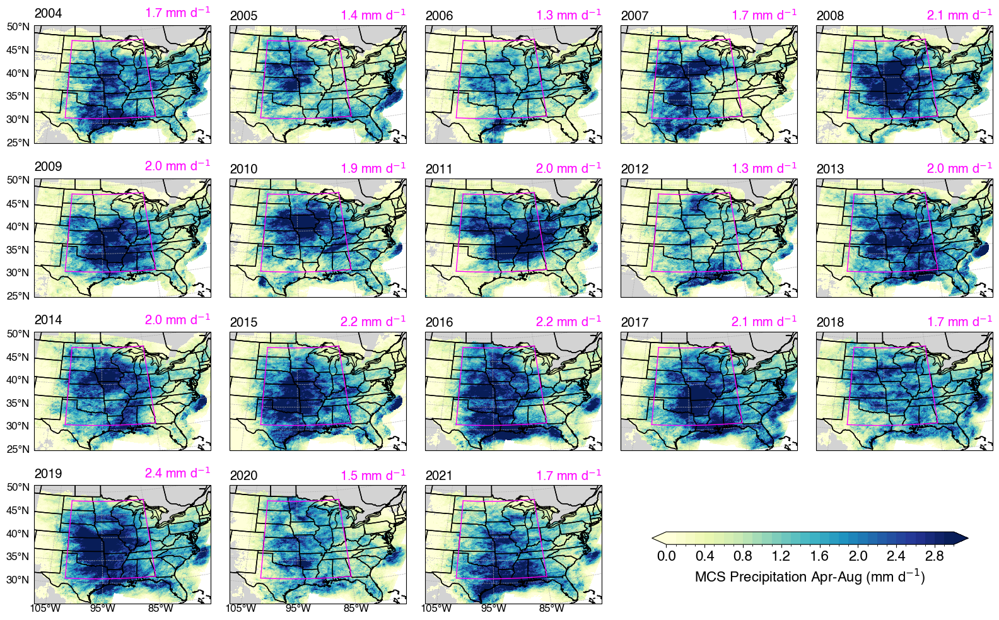

In [23]:
lon = ds.lon
lat = ds.lat
data_arr = mcspcp_year
avg_arr = []
unit = 'mm d$^{-1}$'
for year in years:
    avg_arr.append(f'{mcspcp_avg.sel(year=year).values.item():.1f} {unit}')
levels = np.arange(0, 3.01, 0.1)
cmap = 'YlGnBu'
cblabel = 'MCS Precipitation Apr-Aug (mm d$^{-1}$)'
figname = f'{figdir}Apr-Aug_mcs_mean_rainmap_{year_min}_{year_max}.png'

fig = plot_map_by_year(lon, lat, data_arr, avg_arr, levels, cmap, cblabel, figname)

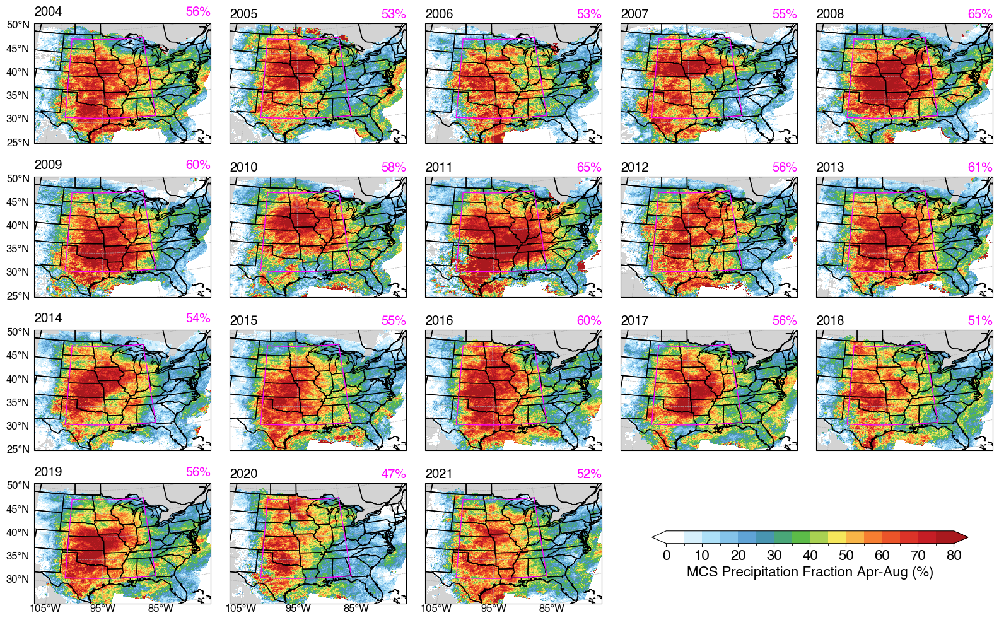

In [24]:
data_arr = mcsfrac_year
unit = '%'
avg_arr = []
for year in years:
    avg_arr.append(f'{mcsfrac_avg.sel(year=year).values.item():.0f}%')
levels = np.arange(0, 80.1, 5)
cmap = generate_NCL_cmap('WhiteBlueGreenYellowRed', cont_opt=False, cont_param_n=0, cont_param_ws='sRGB', white_first=True, white_ext=True)
cmap = truncate_colormap(cmap, 0.0, 0.95)
cblabel = 'MCS Precipitation Fraction Apr-Aug (%)'
figname = f'{figdir}Apr-Aug_mcs_season_mean_rainfracmap_{year_min}_{year_max}.png'

fig = plot_map_by_year(lon, lat, data_arr, avg_arr, levels, cmap, cblabel, figname)

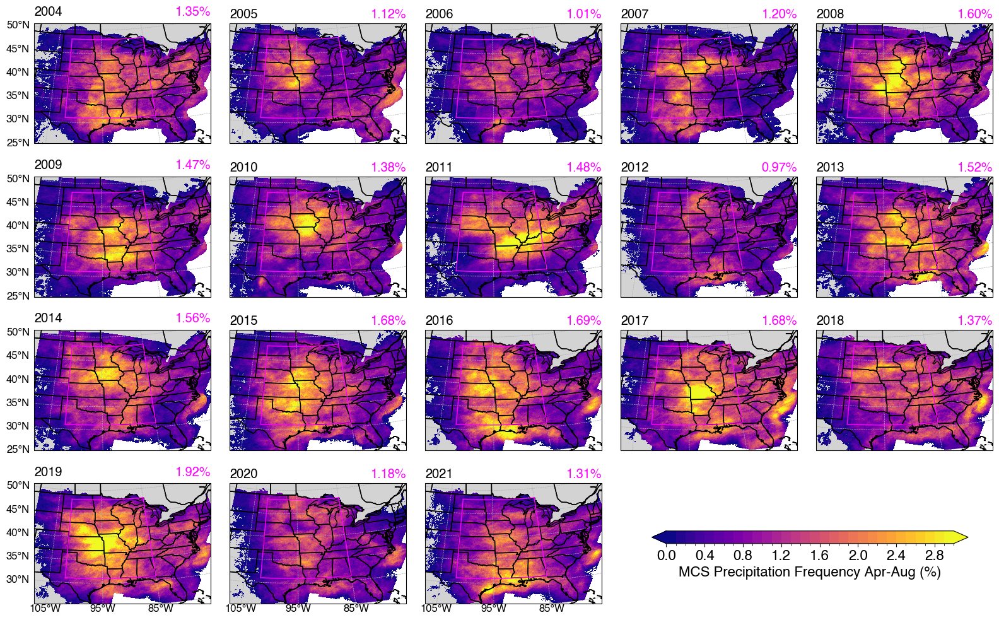

In [25]:
data_arr = mcsfreq_year
avg_arr = []
unit = '%'
for year in years:
    avg_arr.append(f'{mcsfreq_avg.sel(year=year).values.item():.2f}{unit}')
# print(avg_arr)
levels = np.arange(0, 3.01, 0.1)
cmap = 'plasma'
cblabel = 'MCS Precipitation Frequency Apr-Aug (%)'
figname = f'{figdir}Apr-Aug_mcs_season_mean_rainfreqmap_{year_min}_{year_max}.png'

fig = plot_map_by_year(lon, lat, data_arr, avg_arr, levels, cmap, cblabel, figname)

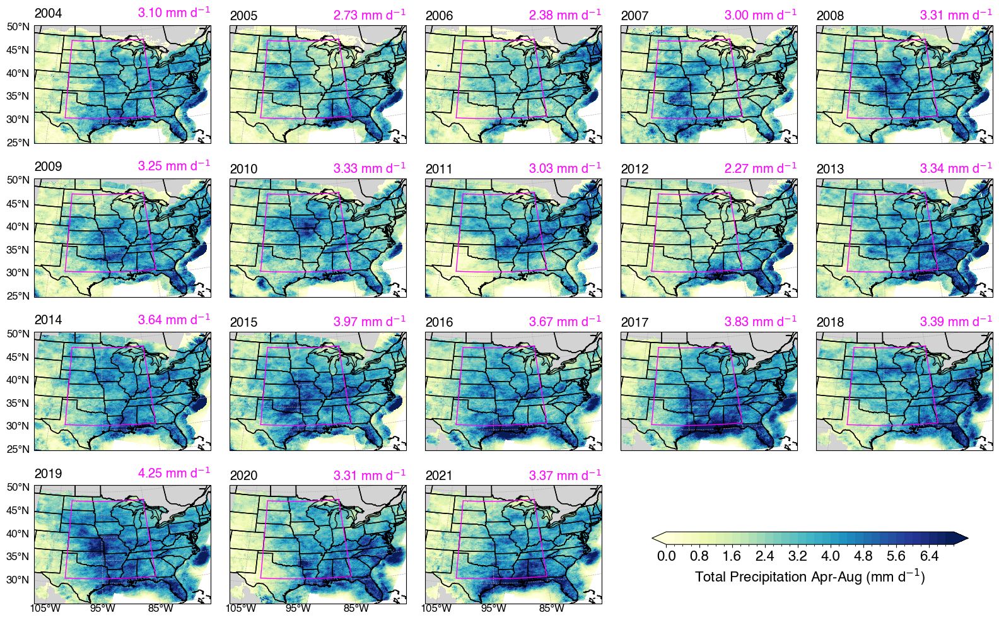

In [26]:
data_arr = totpcp_year
avg_arr = []
unit = 'mm d$^{-1}$'
for year in years:
    avg_arr.append(f'{totpcp_avg.sel(year=year).values.item():.2f} {unit}')
levels = np.arange(0, 7.01, 0.2)
cmap = 'YlGnBu'
cblabel = 'Total Precipitation Apr-Aug (mm d$^{-1}$)'
figname = f'{figdir}total_season_mean_rainmap_{year_min}_{year_max}.png'

fig = plot_map_by_year(lon, lat, data_arr, avg_arr, levels, cmap, cblabel, figname)